In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import torch
import torch.nn as nn
import h5py
import tables
import numpy as np
import pickle
from functools import reduce
from tableone import TableOne

In [4]:
# device = torch.device('cpu')
device = torch.device('cuda:0')

In [5]:
import os
os.chdir('/home/aisinai/work/repos/nis_patient_encoding/')

In [6]:
from data.data_loader import NISDatabase
from data.cohort_builder import CohortBuilder

from utils.experiments import *
from utils.feature_utils import *
from utils.code_mappings import *

from model.autoencoder.autoencoder import AutoEncoder
from model.autoencoder.loss import CustomLoss
from trainer.trainer import Trainer

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
DATA_FOLDER = 'data/raw/'
FIGURE_FOLDER = 'figures/dm/'

# Playground

#### Autoencoder 4.0

In [9]:
case_db = NISDatabase(DATA_FOLDER + 'NIS_2012_2014_proto_emb_v2.h5', 'TRAIN')
control_db = NISDatabase(DATA_FOLDER + 'NIS_2012_2014_proto_emb_v2.h5', 'TRAIN')

In [22]:
DATA_FOLDER = 'data/raw/'
INPUT_FEATURES = {
    'AGE' : {'type': 'one_hot', 'rep_func': None},
    'FEMALE' : {'type': 'one-hot', 'rep_func': None},
    'HCUP_ED' : {'type': 'one-hot', 'rep_func': None},
    'TRAN_IN' : {'type': 'one-hot', 'rep_func': None},
    'ELECTIVE' : {'type': 'one-hot', 'rep_func': None},
    'ZIPINC_QRTL' : {'type': 'one-hot', 'rep_func': None},
    'DXn' : {'type': 'embedding', 'rep_func': None},
    'ECODEn' : {'type': 'embedding', 'rep_func': None},
    'PRn' : {'type': 'embedding', 'rep_func': None},
    'CHRONn' : {'type': 'embedding', 'rep_func': None},
}

DEFAULT_BUILD = {
    'encoding' : {
        'total_layers' : 1,
        'scale' : 4,
        'activation' : 'leaky_relu',
    },

    'latent' : {'dimensions' : 64},

    'decoding' : {
        'scale' : 4,
        'activation' : 'leaky_relu',
        'total_layers' : 1,
        'output_dims' : None
    }
}

EMBEDDING_DICTIONARY = {

     'CHRONn' : {
        'header_prefix' : b'CHRON',
        'num_classes' : 12583,
        'dimensions' : 256,
    },   

    'DXn' : {
        'header_prefix' : b'DX',
        'num_classes' : 12583,
        'dimensions' : 256,
    },

    'PRn' : {
        'header_prefix' : b'PR',
        'num_classes' : 4445,
        'dimensions' : 64,
    },

    'ECODEn' : {
        'header_prefix' : b'ECODE',
        'num_classes' : 1186,
        'dimensions' : 32,
    },

    'CHRONBn' : {
        'header_prefix' : b'CHRONB',
        'num_classes' : 19,
        'dimensions' : 16,
    }
}

ONE_HOT_LIST = [b'ELECTIVE', b'FEMALE', b'HCUP_ED', b'TRAN_IN', b'ZIPINC_QRTL', b'AGE']
ONE_HOTS = { feature.decode('utf-8') : {} for feature in ONE_HOT_LIST }
ONE_HOTS['ELECTIVE']['num_classes'] = 2 # 0,1
ONE_HOTS['FEMALE']['num_classes'] = 2 # 0,1
ONE_HOTS['TRAN_IN']['num_classes'] = 3 # 0-2
ONE_HOTS['HCUP_ED']['num_classes'] = 5 # 0-4
ONE_HOTS['ZIPINC_QRTL']['num_classes'] = 5 # 1-4
ONE_HOTS['AGE']['num_classes'] = 13 # 0-12 (must be allowed to guess in between as well)

CONTINUOUS = {}

FEATURE_REPRESENTATIONS = {}
FEATURE_REPRESENTATIONS['embedding'] = EMBEDDING_DICTIONARY
FEATURE_REPRESENTATIONS['one_hots'] = ONE_HOTS
FEATURE_REPRESENTATIONS['continuous'] = CONTINUOUS

DEFAULT_BUILD['features'] = FEATURE_REPRESENTATIONS

find_nlike_features(case_db.headers, FEATURE_REPRESENTATIONS['embedding'])
FEATURE_REPRESENTATIONS['one_hots'] = create_onehot_info(case_db, FEATURE_REPRESENTATIONS['one_hots'], FEATURE_REPRESENTATIONS['embedding'])
DEFAULT_BUILD['features'] = FEATURE_REPRESENTATIONS
calc_output_dims(DEFAULT_BUILD)

In [10]:
ae = AutoEncoder(DEFAULT_BUILD).to(device)
ae.load_state('/home/aisinai/work/repos/nis_patient_encoding/experiments/train_ae_020/1587303827.pth', device=device)

### Construct Case Cohorts

In [11]:
# data = tables.open_file(DATA_FOLDER + 'NIS_Pruned.h5', 'r')

In [12]:
inclusion_info = {'DXCCS': [112, 109]}
case_control_info = {'DX': [map_icd9_to_numeric('42731'),]}
cohort_build_info = {'inclusion': inclusion_info, 'case_control': case_control_info}

In [13]:
cb = CohortBuilder(filter_params=cohort_build_info)

In [14]:
cb.filter_patients()

DXCCS [112, 109]
0
1000000
2000000
3000000
4000000
5000000
6000000
7000000
8000000
9000000
10000000
11000000
12000000
13000000
14000000
15000000
16000000
17000000
DX [42731]
0
1000000
2000000
3000000
4000000
5000000
6000000
7000000
8000000
9000000
10000000
11000000
12000000
13000000
14000000
15000000
16000000
17000000


In [15]:
cb.match_patients(ae, device=device)

Embedding in latent space...
Building index trees...hold tight -_- eek.
Finding nearest neighbors...
Level 0 finished. Matched 3013. Remaining 47.
Level 1 finished. Matched 45. Remaining 2.
Level 2 finished. Matched 2. Remaining 0.


In [16]:
dm = cb.matchers['deep']['matcher']

### Performance / Tables 2-3

In [17]:
feature_info = DEFAULT_BUILD['features']

In [18]:
cb.set_match_keys('deep')

In [19]:
b4e = cb._create_batch_for_eval('deep', feature_info)

In [20]:
from similarity.sim_metrics import perform_ttest

In [21]:
# Find CHADS_VASC scores
dbp = NISDatabase(DATA_FOLDER + 'NIS_Pruned.h5', 'case', state_inds=cb.inds['matched'])

In [22]:
for state in ['case', 'control']:
    dbp.change_state(state)
    scores = get_chadsvasc(dbp)
    scores = one_hot_encode(scores, 9)
    b4e[state]['CHADS_VASC'] = scores

Retrieving CHADS-VASC, chunk:  0
Retrieving CHADS-VASC, chunk:  0


(array([2.06e+03, 1.50e+01, 9.20e+01, 1.58e+02, 0.00e+00, 2.33e+02,
        3.24e+02, 1.46e+02, 3.00e+01, 2.00e+00]),
 array([0. , 0.8, 1.6, 2.4, 3.2, 4. , 4.8, 5.6, 6.4, 7.2, 8. ]),
 <a list of 10 Patch objects>)

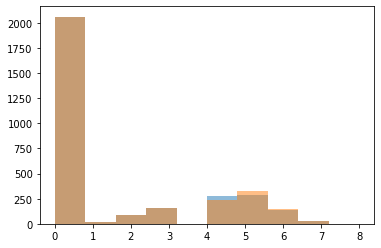

In [23]:
plt.hist(np.where(b4e['case']['CHADS_VASC'])[1], alpha=0.5)
plt.hist(np.where(b4e['control']['CHADS_VASC'])[1], alpha=0.5)

In [24]:
# DM w/o CCS
perform_ttest(b4e['case'], b4e['control'])

,P-Value,Chi-Statistic,Type
CHRONn,0.000000e+00,4574.609665,Categorical
DXn,0.000000e+00,5646.449471,Categorical
PRn,6.822520e-176,1729.892070,Categorical
ECODEn,1.820883e-16,260.506894,Categorical
CHRONBn,2.341041e-93,486.504858,Categorical
ELECTIVE,9.444394e-01,0.004857,Categorical
FEMALE,9.707787e-01,0.001342,Categorical
HCUP_ED,6.629783e-01,2.398058,Categorical
TRAN_IN,6.320909e-01,0.917444,Categorical
ZIPINC_QRTL,9.983955e-01,0.033361,Categorical


In [25]:
# DM w/ CCS
perform_ttest(b4e['case'], b4e['control'])

,P-Value,Chi-Statistic,Type
CHRONn,0.000000e+00,7074.149350,Categorical
DXn,0.000000e+00,7334.736675,Categorical
PRn,0.000000e+00,3426.829752,Categorical
ECODEn,2.741713e-31,359.792174,Categorical
DXCCSn,0.000000e+00,6030.694799,Categorical
ELECTIVE,9.444394e-01,0.004857,Categorical
FEMALE,1.000000e+00,0.000000,Categorical
HCUP_ED,1.000000e+00,0.000000,Categorical
TRAN_IN,1.000000e+00,0.000000,Categorical
ZIPINC_QRTL,1.000000e+00,0.000000,Categorical


## Table 1

In [25]:
temp_db = tables.open_file(DATA_FOLDER + 'NIS_Pruned.h5')
outcome_headers = [col.decode('utf-8') for col in temp_db.root.outcome_headers[:]]
temp_db.close()

In [375]:
print(list(COMORBIDITIES['Genitourinary Disorders']['DXCCS']))

[163, 164, 165, 166, 167, 168, 169, 170, 171, 172]


In [26]:
COMORBIDITIES = {
    'Cancer' : {'DXCCS' : list(np.arange(11, 48))},
    'Chronic Fluid + Electrolyte Disorders' : {'DXCCS' : [55,]},
    'Chronic Anemia' : {'DXCCS' : [59, 60, 61]},
    'Chronic Coagulopathy' : {'DXCCS' : [62,]},
    'Chronic Neurological Conditions' : {'DXCCS' : list(np.arange(76, 85)) + [93, 95]},
    'Essential Hypertension' : {'DXCCS' : [98,]},
    'Hypertension - Complicated' : {'DXCCS' : [99,]},
    'Chronic Cardiac Disease' : {'DXCCS' : [96, 97, 100, 101, 103, 104, 105, 106, 107, 108, ]},
    'Chronic CHF' : {'DXCCS' : [108, ]},
    'Cardiac Conduction Disorders' : {'DXCCS' : [105, 106, 107]},
    'Chronic Respiratory Disease' : {'DXCCS' : [127, 128, 131, 132, 133, 134]},
    'Chronic GI Illnesses' : {'DXCCS' : [135, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 152, 153, 154, 155]},
    'Chronic Hepatobiliary Disease' : {'DXCCS' : [6, 149, 151]},
    'Chronic Kidney Disease' : {'DXCCS' : [158,]},
    'Immune-mediated Rheumatopathies' : {'DXCCS' : [202, 210, 211, ]},
    'Diabetes' : {'DXCCS' : [49, 50]},
    'Chronic Stroke' : {'DXCCS' : [109, 112]},
    'Osteoporosis' : {'DXCCS' : [206,]},
    'Osteoarthritis' : {'DXCCS' : [203, ]},
    'Skin Disorders': {'DXCCS' : [197, 198, 199, 200]},
    'Genitourinary Disorders' : {'DXCCS' : list(np.arange(163, 173))},   
}

In [27]:
SEVERITIES = {
    'Multilevel Liver Disease' : {
        1: {'DX': [7022, 7023, 7032, 7033, 7044, 7054, 706, 709, 
                   57000, 57100, 57110, 57220, 57330, 57440, 57441, 57442, 57443, 57444, 
                   57330, 57340, 57380, 57390]},
        2: {'DX': [7022, 7023, 7032, 7033, 7044, 7054, 7060, 7090, 
                   57000, 5710, 5711, 5722, 5733, 57440, 57441, 57442, 57443, 57444, 
                   57330, 57340, 57380, 57390,
                   45600, 45610, 45620, 45621,
                   57220, 57230, 57240, 57280]}
    }, 
    
    'Multilevel Diverticulitis' : {
        1: {'DX': [56211, 56113]},
        2: {'DX': [56211, 56113, 56983, 56722, 56950, 56731, 56738, 61450, 56721, 56729]}
    }, 
    
    'Multilevel Chronic Kidney Disease' : {
        1: {'DX': [58510, ]},
        2: {'DX': [58520, ]},
        3: {'DX': [58530, ]},
        4: {'DX': [58540, ]},
        5: {'DX': [58550, ]}, 
        6: {'DX': [58560, ]},
    },
    
    'Multilevel Diabetes' : {
        1: {'DXCCS': [49, ]},
        2: {'DXCCS': [50, ]}
    }
}

In [29]:
def create_table_one(inds_dict):
    
    DESIRED_COLS = [
         b'AGE',
         b'CM_AIDS',
         b'CM_ALCOHOL',
         b'CM_ANEMDEF',
         b'CM_ARTH',
         b'CM_BLDLOSS',
         b'CM_CHF',
         b'CM_CHRNLUNG',
         b'CM_COAG',
         b'CM_DEPRESS',
         b'CM_DM',
         b'CM_DMCX',
         b'CM_DRUG',
         b'CM_HTN_C',
         b'CM_HYPOTHY',
         b'CM_LIVER',
         b'CM_LYMPH',
         b'CM_LYTES',
         b'CM_METS',
         b'CM_NEURO',
         b'CM_OBESE',
         b'CM_PARA',
         b'CM_PERIVASC',
         b'CM_PSYCH',
         b'CM_PULMCIRC',
         b'CM_RENLFAIL',
         b'CM_TUMOR',
         b'CM_ULCER',
         b'CM_VALVE',
         b'CM_WGHTLOSS',
         b'ELECTIVE',
         b'FEMALE',
         b'HCUP_ED',
         b'HOSP_DIVISION',
         b'PAY01',
         b'PL_NCHS',
         b'TRAN_IN',
         b'TRAN_OUT',
         b'ZIPINC_QRTL'
    ]
    
    DESIRED_COLS = [col.decode('utf-8') for col in DESIRED_COLS]
    
    dbp = NISDatabase(DATA_FOLDER + 'NIS_Pruned.h5', 'case', state_inds=inds_dict)
    dbp.set_batch_size(100000)

    records = pd.DataFrame(columns=DESIRED_COLS)
    DESIRED_INDS = [find_feature(dbp.headers, feature)[0] for feature in DESIRED_COLS]
    
    for cohort in dbp.state_inds.keys():

        dbp.change_state(cohort)
        dbp.set_dataset_key('dataset')

        cohort_data = retrieve_elements_from_db(dbp, DESIRED_INDS, num_cols='multiple')
        cohort_data = pd.DataFrame(cohort_data, columns=DESIRED_COLS).astype('int')

        comorbs = get_comorbidities(dbp, COMORBIDITIES)
        cohort_data = cohort_data.join(comorbs, how='left')
        
        severities = get_severity(dbp, SEVERITIES)
        cohort_data = cohort_data.join(severities, how='left')

        cohort_data['CHADS_VASC'] = get_chadsvasc(dbp).astype('int')
        cohort_data['CASECONTROL'] = cohort

        dbp.set_dataset_key('outcomes')

        outcomes = retrieve_elements_from_db(dbp, np.arange(0, 8), num_cols='multiple')
        outcomes = pd.DataFrame(outcomes, columns=outcome_headers).astype('int')
        outcomes.loc[outcomes['DIED'] == -128, 'DIED'] = 0

        record = cohort_data.join(outcomes, how='left')
        records = pd.concat((records, record))
        
        print(f'{cohort} finished.')
    
    continuous = ['AGE', 'TOTCHG', 'LOS']
    drop = ['APRDRG', 'DRG']

    records.drop(drop, axis=1, inplace=True)
    categoricals = list(np.setdiff1d(list(records.columns), continuous))

    print("Finished constructing the table. Now performing stats...")
    table = TableOne(records, columns=list(records.columns), categorical=categoricals, groupby='CASECONTROL', missing=False, pval=True, overall=False)

    for idx in table.tableone.index:
        var_name = idx[0].split(',')[0]
        if var_name in continuous:
            records[var_name] = records[var_name].astype('float')
            var_desc = records.groupby('CASECONTROL')[var_name].describe(include='all')
            table.tableone.loc[f'{var_name}, mean (SD)', ('Grouped by CASECONTROL', 'case')] = '{0:0.1f} ({1:0.1f})'.format(var_desc['mean']['case'], var_desc['std']['case'])
            table.tableone.loc[f'{var_name}, mean (SD)', ('Grouped by CASECONTROL', 'control')] = '{0:0.1f} ({1:0.1f})'.format(var_desc['mean']['control'], var_desc['std']['control'])

    return records, table

In [54]:
t1records, t1t = create_table_one(cb.inds['filtered'])

Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
case finished.
Retrieving data elements, chunk:  0
Retrieving data elements, chunk:  1
Retrieving data elements, chunk:  2
Retrieving data elements, chunk:  3
Retrieving data elements, chunk:  4
Retrieving data elements, chunk:  5
Retrieving comorbidities, chunk:  0
Retrieving comorbidities, chunk:  1
Retrieving comorbidities, chunk:  2
Retrieving comorbidities, chunk:  3
Retrieving comorbidities, chunk:  4
Retrieving comorbidities, chunk:  5
Retrieving severities, chunk:  0
Retrieving severities, chunk:  1
Retrieving severities, chunk:  2
Retrieving severities, chunk:  3
Retrieving severities, chunk:  4
Retrieving severities, chunk:  5
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
Retrieving data elements, chunk:  1
Retrieving data elements, chunk:  2
Retrieving data elements, chunk:  3
Retr

In [81]:
t1t.to_excel(DATA_FOLDER + 'NIS_cc_TableOne.xlsx')

with open(DATA_FOLDER + 'NIS_cc_t1t.pickle', 'wb') as t1t_f:
    pickle.dump(t1t, t1t_f)

In [56]:
t1records['CASECONTROL'] = t1records['CASECONTROL'].replace({'case' : 1, 'control' : 0})
t1records.to_csv(DATA_FOLDER + 'NIS_cc_stroke_psminput_20200526.csv')

In [57]:
print(t1t.tabulate(tablefmt='grid'))

+----------------------------------------------+---------+-------------------+--------------------+-----------+
|                                              |         | case              | control            | P-Value   |
+==============================================+=========+===================+====================+===========+
| n                                            |         | 3060              | 551526             |           |
+----------------------------------------------+---------+-------------------+--------------------+-----------+
| AGE, mean (SD)                               |         | 75.9 (11.4)       | 69.8 (14.7)        | <0.001    |
+----------------------------------------------+---------+-------------------+--------------------+-----------+
| CM_AIDS, n (%)                               | 0       | 3060 (100.0)      | 550648 (99.8)      | 0.019     |
+----------------------------------------------+---------+-------------------+--------------------+-----

In [30]:
tableones = {}
try:
    tableones['filtered'] = t1t
except:
    with open(DATA_FOLDER + 'NIS_cc_t1t.pickle', 'rb') as t1t_f:
        tableones['filtered'] = pickle.load(t1t_f)

## FIGURE 1B

### Random Patients

In [47]:
dbp = NISDatabase(DATA_FOLDER + 'NIS_Pruned.h5', 'full')

random_inds = np.arange(0, dbp.dataset_len)
np.random.shuffle(random_inds)
random_inds = random_inds[:10000]
random_inds = np.sort(random_inds)

dbp.set_inds(random_inds)

db = NISDatabase(DATA_FOLDER + 'NIS_2012_2014_proto_emb_v2.h5', 'full')
db.set_inds(random_inds)

In [48]:
db.labels = {}
db.labels['CHADSVASC'] = get_chadsvasc(dbp)
print('chads vasc')
db.labels['Age'] = retrieve_elements_from_db(dbp, 0)
print('age')
db.labels['Gender'] = retrieve_elements_from_db(dbp, list(dbp.headers).index(b'FEMALE'))
print('gender')
db.labels['Elective Admission'] = retrieve_elements_from_db(dbp, list(dbp.headers).index(b'ELECTIVE'))
print('elective')
db.labels['Income Quartile by Zipcode'] = retrieve_elements_from_db(dbp, -1)
print('zipinc_qrtl')

dbp.set_dataset_key('outcomes')
db.labels['APRDRG - Mortality Risk Score'] = retrieve_elements_from_db(dbp, 1)
print('mortalityr')
db.labels['Died In Hospitalization'] = retrieve_elements_from_db(dbp, 3)
db.labels['Died In Hospitalization'][db.labels['Died In Hospitalization'] == -128] = 0
print('mortality')

Retrieving CHADS-VASC, chunk:  0
chads vasc
Retrieving data elements, chunk:  0
Retrieving data elements, chunk:  1
Retrieving data elements, chunk:  2
Retrieving data elements, chunk:  3
Retrieving data elements, chunk:  4
Retrieving data elements, chunk:  5
Retrieving data elements, chunk:  6
Retrieving data elements, chunk:  7
Retrieving data elements, chunk:  8
Retrieving data elements, chunk:  9
age
Retrieving data elements, chunk:  0
Retrieving data elements, chunk:  1
Retrieving data elements, chunk:  2
Retrieving data elements, chunk:  3
Retrieving data elements, chunk:  4
Retrieving data elements, chunk:  5
Retrieving data elements, chunk:  6
Retrieving data elements, chunk:  7
Retrieving data elements, chunk:  8
Retrieving data elements, chunk:  9
gender
Retrieving data elements, chunk:  0
Retrieving data elements, chunk:  1
Retrieving data elements, chunk:  2
Retrieving data elements, chunk:  3
Retrieving data elements, chunk:  4
Retrieving data elements, chunk:  5
Retrievin

In [49]:
dbp.set_dataset_key('dataset')
comorbs = get_comorbidities(dbp, COMORBIDITIES)

for comorbidity in comorbs.columns:
    db.labels[comorbidity] = np.array(comorbs[comorbidity])

Retrieving comorbidities, chunk:  0
Retrieving comorbidities, chunk:  1
Retrieving comorbidities, chunk:  2
Retrieving comorbidities, chunk:  3
Retrieving comorbidities, chunk:  4
Retrieving comorbidities, chunk:  5
Retrieving comorbidities, chunk:  6
Retrieving comorbidities, chunk:  7
Retrieving comorbidities, chunk:  8
Retrieving comorbidities, chunk:  9


In [50]:
from sklearn.manifold import TSNE

def fit_tsne_on_ls(db, model, ls_dim, device):
    
    latent_space_embedded = TSNE(n_components=2, random_state=0)
    
    # Convert to latent space
    print("Converting patients to latent space...")
    pts_ls = np.empty((db.dataset_len, ls_dim))
    for idx, pts in enumerate(db.iterator):
        s_idx = idx * db.batch_size
        e_idx = s_idx + pts.shape[0]
        
        pts = pts.to(device)    
        pts_ls[s_idx:e_idx, :] = model.latent_representation(pts).to('cpu').detach()
    
    print("Fitting T-SNE...")
    latent_space_embedded.fit(pts_ls)
    return latent_space_embedded    
    
def plot_patients_in_latent_space(lse, labels, title=''):
    # Plotting
    plt.style.use('seaborn-ticks')
    
    fig, ax = plt.subplots(4, 6, figsize=(64, 36))

    for ax_i, (ln, label) in zip(ax.flat, labels.items()):  
        b = sns.scatterplot(*lse.embedding_.T, 
                        hue=label.astype('int'), 
                        alpha=0.5, 
                        linewidth=0.1,
                        ax=ax_i)
    
        b.axes.set_title('TSNE - {0}'.format(ln), fontsize=36, fontweight='bold', pad=12)
        b.axes.xaxis.set_visible(False)
        b.axes.yaxis.set_visible(False)
        
    plt.tight_layout(pad=0.4)
    
#     b.set_xlabel("Axis 1",fontsize=16)
#     b.set_ylabel("Axis 2",fontsize=16)
    
#     b.tick_params(labelsize=16)

In [51]:
lse = fit_tsne_on_ls(db, ae, 64, device)

Converting patients to latent space...
Fitting T-SNE...


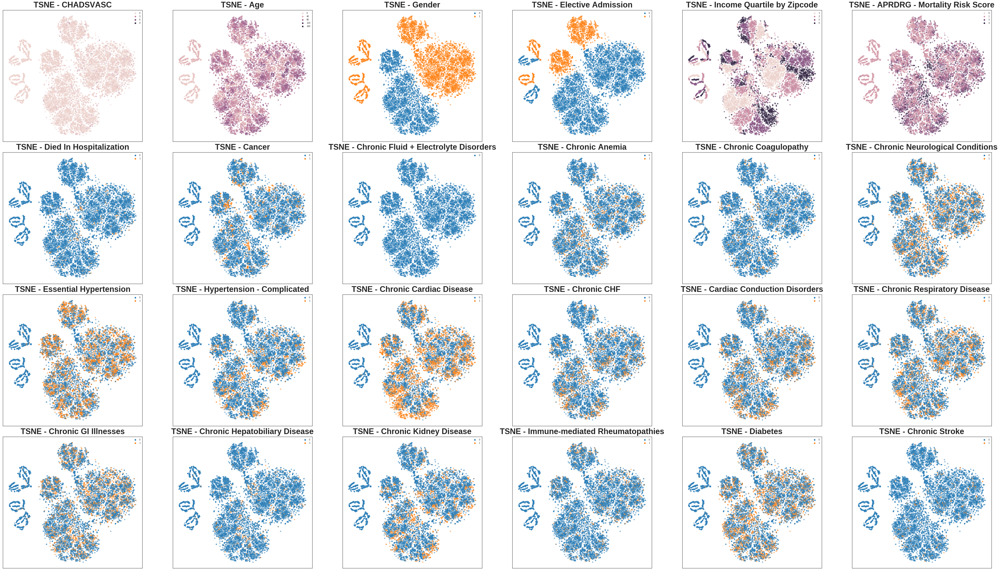

In [52]:
plot_patients_in_latent_space(lse, db.labels)
plt.savefig(FIGURE_FOLDER + f'NIS_cc_Figure1B.png')

# Table 2

In [53]:
cb.set_match_keys('deep')

In [54]:
# W/O CCS
t2dat, tableones['deep'] = create_table_one(cb.inds['matched'])
print(tableones['deep'].tabulate(tablefmt='grid'))

Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
case finished.
Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
control finished.
Finished constructing the table. Now performing stats...
+----------------------------------------------+---------+-------------------+-------------------+-----------+
|                                              |         | case              | control           | P-Value   |
+==============================================+=========+===================+===================+===========+
| n                                            |         | 3060              | 3060              |           |
+----------------------------------------------+---------+-------------------+-------------------+-----------+
| AGE, 

In [56]:
tableones['deep'].to_excel(DATA_FOLDER + 'NIS_cc_TableTwo_DeepMatch.xlsx')

## PSM

In [57]:
# After matching in R...
def load_R_psm_results(prefix, suffix):
    psm_inds = {'case' : None, 'control' : None}
    for cohort in ['case', 'control']:
#         psm_res = pd.read_csv(DATA_FOLDER + 'psm_res/' + prefix + f'{cohort}' + suffix)
        psm_res = pd.read_csv(DATA_FOLDER + prefix + f'{cohort}' + suffix)
        psm_res = np.array(psm_res['x'])
        psm_res_unique, counts = np.unique(psm_res, return_counts=True)
        psm_inds[cohort] = psm_res_unique.astype('int')
        
    return psm_inds

In [59]:
for psm_i in range(2,37):
    psm_i_res = load_R_psm_results(f'NIS_cc_stroke_psminput_20200526.csv_rpsm_', f'_{psm_i}.csv')
    cb.matchers[f'psm_{psm_i}'] = {}
    cb.matchers[f'psm_{psm_i}']['matches'] = psm_i_res

# Table 3

In [60]:
for i in range(2, 37):
    cb.set_match_keys(f'psm_{i}')
    try:
        t3dat, tableones[f'psm_{i}'] = create_table_one(cb.inds['matched'])
        tableones[f'psm_{i}'].to_excel(DATA_FOLDER + f'NIS_cc_TableThree_PSM_{i}.xlsx')
    except:
        print('Error with {0}'.format(i))
    else:
        print(i)
#     print(tableones['psm_nocv'].tabulate(tablefmt='grid'))

Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
case finished.
Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
control finished.
Finished constructing the table. Now performing stats...
2
Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
case finished.
Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
control finished.
Finished constructing the table. Now performing stats...
3
Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHAD

## FIGURE 3

In [133]:
cb.set_match_keys('deep')

In [ ]:
def get_ls_match_res(cb, matcher_name, ls_tsne):
    ls_db = cb.matchers['deep'].ls_db
    cases_ls = ls_db.dataset[cb.matchers[matcher_name].matches['case']]
    control_ls = ls_db[np.sort(cb.matchers[matcher_name].matches['control'] + 
                                          ls_db.state_inds['control'].min())]
    
    # Plot in the T-SNE
    

In [213]:
def plot_barcodes_in_ls(cb, matcher_name, title):
    fig, axes = plt.subplots(3, 2, figsize=(20, 6))
    
    ls_db = cb.matchers['deep']['matcher'].ls_db
    
    if matcher_name == 'filtered':
        break_ind = ls_db.state_inds['control'].min()
        cases_ls = ls_db.dataset[:break_ind]
        control_ls = ls_db.dataset[break_ind:]
        
    else:
        cases_ls = ls_db.dataset[cb.matchers[matcher_name]['matches']['case']]
        control_ls = ls_db.dataset[np.sort(cb.matchers[matcher_name]['matches']['control'] + 
                                              ls_db.state_inds['control'].min())]
    
    def barcode(array, size=10):
        return np.multiply(array.reshape(-1, 1), np.ones((1, size))).T

    def barcode_std(arr, size=10):
        array = np.std(arr, axis=0)
        return np.multiply(array.reshape(-1, 1), np.ones((1, size))).T


    
    cases_ls_mean = np.mean(cases_ls, axis=0)
    control_ls_mean = np.mean(control_ls, axis=0)
    
    plt.style.use('seaborn-white')

    axes[0][0].imshow(barcode(cases_ls_mean) > 0, vmin=0, vmax=1)
    axes[0][0].set_title('Mean Cases Barcode, Binary')
    axes[1][0].imshow(barcode(control_ls_mean) > 0, vmin=0, vmax=1)
    axes[1][0].set_title('Mean Controls Barcode, Binary')
    axes[2][0].imshow(((barcode(cases_ls_mean) > 0) * ~(barcode(control_ls_mean) > 0)), vmin=0, vmax=1)
    axes[2][0].set_title('Difference of Means Barcode, Binary')
    
    axes[0][1].imshow(barcode(cases_ls_mean), vmin=-2, vmax=2)
    axes[0][1].set_title('Mean Cases Barcode, Continuous')
    axes[1][1].imshow(barcode(control_ls_mean), vmin=-2, vmax=2)
    axes[1][1].set_title('Mean Controls Barcode, Continuous')
    axes[2][1].imshow(barcode(cases_ls_mean) - barcode(control_ls_mean), vmin=-2, vmax=2)
    axes[2][1].set_title('Difference of Means Barcode, Continuous')
    
    for axis in axes.ravel():
        axis.xaxis.set_visible(False)
        axis.yaxis.set_visible(False)
    
    fig.suptitle('Matching Performance: {0}'.format(title), fontsize=16)
    

In [223]:
from sklearn.manifold import TSNE

def fit_tsne_on_ls_matched(cb, matcher_name, title):
    
    lse = TSNE(n_components=2, random_state=0)
    ls_db = cb.matchers['deep']['matcher'].ls_db
    
    if matcher_name == 'filtered':
        break_ind = ls_db.state_inds['control'].min()
        cases_ls = ls_db.dataset[:break_ind]
        control_ls = ls_db.dataset[break_ind:]
        
    else:
        cases_ls = ls_db.dataset[cb.matchers[matcher_name]['matches']['case']]
        control_ls = ls_db.dataset[np.sort(cb.matchers[matcher_name]['matches']['control'] + 
                                              ls_db.state_inds['control'].min())]
        
    pts_ls = np.vstack((cases_ls, control_ls))
    print(pts_ls.shape)
    cohort_label = np.hstack((['case'] * cases_ls.shape[0], ['control'] * control_ls.shape[0]))
    
    print("Fitting T-SNE...")
    lse.fit(pts_ls)

    # Plotting
    plt.style.use('seaborn-ticks')
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    b = sns.scatterplot(*lse.embedding_.T, 
#                     hue=labels.astype('int'), 
#                     hue=cohort_label,
                    style=cohort_label,
                    alpha=0.5, 
                    linewidth=0.1)
    
    b.axes.set_title('TSNE - {0}'.format(title), fontsize=18, fontweight='bold', pad=12)
    b.axes.xaxis.set_visible(False)
    b.axes.yaxis.set_visible(False)
#     b.set_xlabel("Axis 1",fontsize=16)
#     b.set_ylabel("Axis 2",fontsize=16)
    
#     b.tick_params(labelsize=16)

In [ ]:
for thing, title in zip(['deep', 'psm_nocv'], ['DeepMatch', 'Propensity Score Matching', ]):
    fit_tsne_on_ls_matched(cb, thing, title)
    plt.savefig(FIGURE_FOLDER + f'Figure3_TSNE_{title}.png')

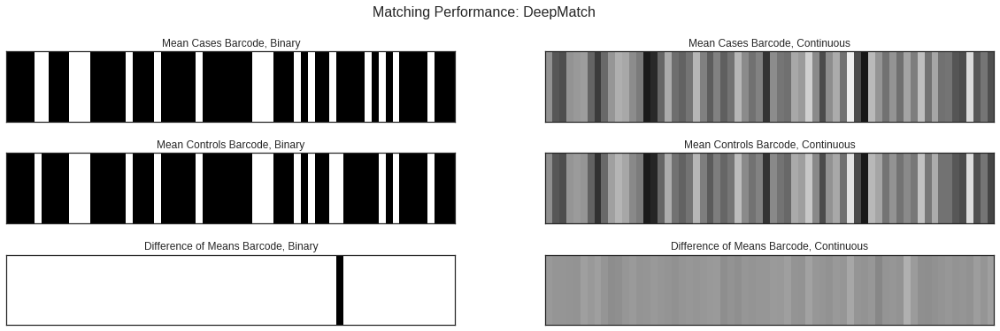

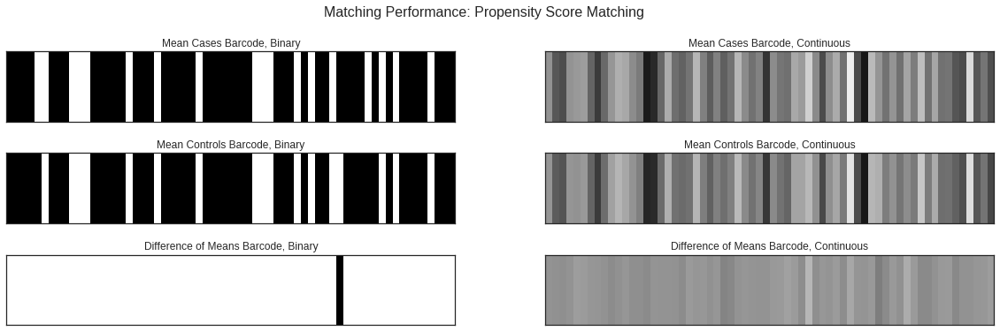

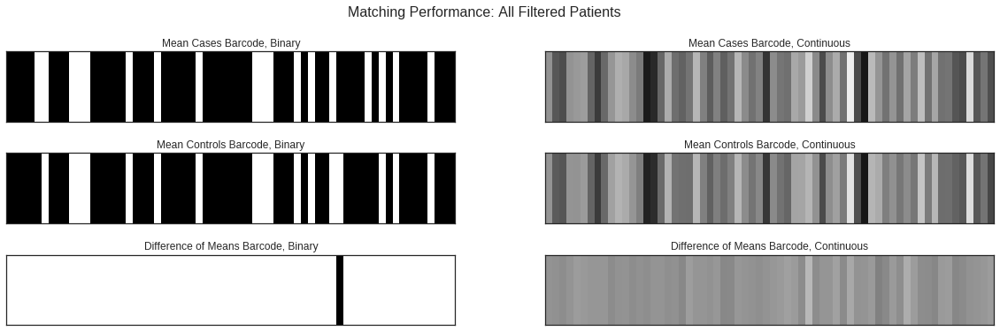

In [215]:
for thing, title in zip(['deep', 'psm_nocv', 'filtered'], ['DeepMatch', 'Propensity Score Matching', 'All Filtered Patients']):
    plot_barcodes_in_ls(cb, thing, title)
    plt.savefig(FIGURE_FOLDER + f'Figure3_Barcodes_{title}.png')

## Figure 4

In [67]:
def plot_number_of_features(tableones):
    significant_features = pd.DataFrame(index=list(tableones.keys()))
    all_pvals = pd.DataFrame(columns=list(tableones.keys()), dtype=float)
    
    for method, table1 in tableones.items():
        p_values = []
        for name, pval in table1.tableone['Grouped by CASECONTROL']['P-Value'].replace({'<0.001' : 0.001}).iteritems():
            if 'CASECONTROL' in name[0]:
                continue
                
            if 'CM_' in name[0]:
                continue
            
            if 'APRDRG' in name[0]:
                break
            
            if pval != '':
                p_values.append(float(pval))
                all_pvals.loc[name[0].split(',')[0], method] = float(pval)
                
        significant_features.loc[method, 'Number of Matched Features (P ≥ 0.05)'] = np.sum(np.array(p_values) >= 0.05)
        
    plt.style.use('seaborn-ticks')
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 14))
    
    # cmap = sns.cubehelix_palette(as_cmap=True, light=0.9, dark=0.5, start=10, reverse=True)
    cmap = sns.cubehelix_palette(as_cmap=True, light=0.9, dark=0.7, reverse=True)
    
    b1 = sns.heatmap(all_pvals, ax=ax1, annot=True, fmt=".3f", cmap=cmap, cbar=False)
    b2 = sns.heatmap(all_pvals >= 0.05, ax=ax2, cmap=cmap, cbar=False, linewidths=0.1, vmin=-0.5, vmax=1.5, linecolor='black')
        
    b1.axes.set_title('P-Values by Matching Algorithm', fontsize=24, fontweight='bold', pad=12)
    b2.axes.set_title('Nonsignificant P-Values by Matching Algorithm', fontsize=24, fontweight='bold', pad=12)
    
    b1.tick_params(labelsize=16)
    b2.tick_params(labelsize=16)    
    
    fig.tight_layout()
    
    plt.savefig(FIGURE_FOLDER + 'Figure4_PValueVisualization.png')
    
    cmap = sns.cubehelix_palette(n_colors=significant_features.shape[0], light=0.8, dark=0.1, reverse=True)
    
#     fig, ax = plt.subplots(figsize=(15, 5))    
#     sns.barplot(x='index', y='Number of Matched Features (P ≥ 0.05)', data=significant_features)
    significant_features.plot(figsize=(15, 5), kind='bar')
    
    plt.savefig(FIGURE_FOLDER + 'Figure5_NumPVals.png')
        
    return significant_features, all_pvals

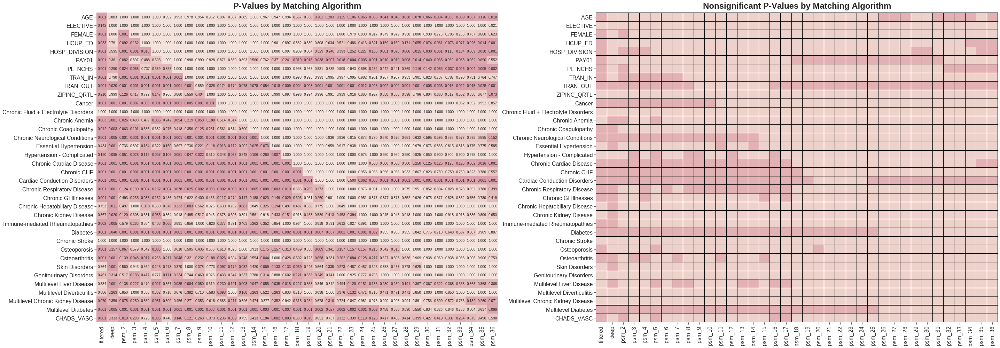

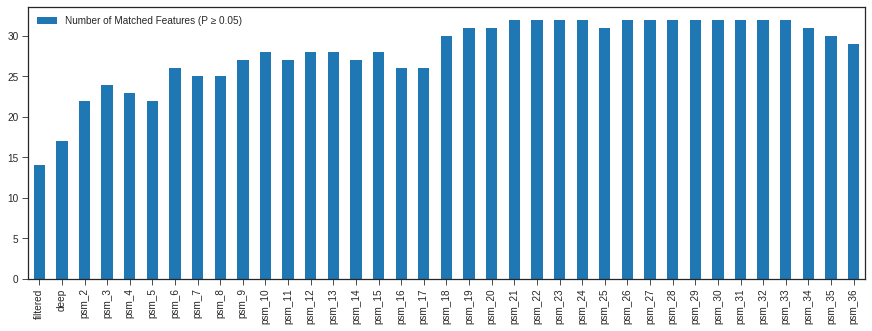

In [68]:
num_pvals, all_pvals = plot_number_of_features(tableones)

## PSM Multi-Seed Experiment

In [96]:
PSM_FOLDER = 'data/raw/psm_res/'

In [98]:
np.save('data/raw/psm_res/summary_table.npy', psm_performance)

In [182]:
t1records = pd.read_csv(DATA_FOLDER + 'NIS_cc_stroke_psminput_20200526.csv', index_col=0)

In [172]:
t1records.shape

(554586, 72)

In [187]:
t1records.index.max()

551525

In [154]:
(psm_i_res['control'] + psm_i_res['case'].max()).max()

551973

In [173]:
temp = t1records.iloc[0:5, :]

In [181]:
t1records.loc[0, 'CASECONTROL']

0    3
0    0
Name: CASECONTROL, dtype: int64

In [343]:
def create_table_one_for_psm(psm_res_i, t1records):
    
    records = pd.DataFrame()
    for cohort_type, cohort_inds in psm_res_i.items():
        cohort_data = t1records.iloc[cohort_inds, :].copy()
        cohort_data['CASECONTROL'] = cohort_type
        records = pd.concat((records, cohort_data))
    
    continuous = ['AGE', 'TOTCHG', 'LOS']

    categoricals = list(np.setdiff1d(list(records.columns), continuous))
    table = TableOne(records, columns=list(records.columns), categorical=categoricals, groupby='CASECONTROL', missing=False, pval=True, overall=False)

    for idx in table.tableone.index:
        var_name = idx[0].split(',')[0]
        if var_name in continuous:
            records[var_name] = records[var_name].astype('float')
            var_desc = records.groupby('CASECONTROL')[var_name].describe(include='all')
            table.tableone.loc[f'{var_name}, mean (SD)', ('Grouped by CASECONTROL', 'case')] = '{0:0.1f} ({1:0.1f})'.format(var_desc['mean']['case'], var_desc['std']['case'])
            table.tableone.loc[f'{var_name}, mean (SD)', ('Grouped by CASECONTROL', 'control')] = '{0:0.1f} ({1:0.1f})'.format(var_desc['mean']['control'], var_desc['std']['control'])
    
    return records, table

In [ ]:
create_table_one()

In [325]:
psm_i_res = load_R_psm_results(f'psm_res/NIS_cc_stroke_psminput_20200526.csv_rpsm_', 
                                       f'_{23}_seed_{3}.csv')

In [326]:
psm_i_res['control'] += psm_i_res['case'].shape[0]

In [327]:
_, tab1 = create_table_one_for_psm(psm_i_res, t1records)

In [280]:
cb.matchers['psm_23_3'] = {'matches': psm_i_res}

In [281]:
cb.set_match_keys('psm_23_3')

In [284]:
psm_i_rec, tab1 = create_table_one(cb.inds['matched'])

Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
case finished.
Retrieving data elements, chunk:  0
Retrieving comorbidities, chunk:  0
Retrieving severities, chunk:  0
Retrieving CHADS-VASC, chunk:  0
Retrieving data elements, chunk:  0
control finished.
Finished constructing the table. Now performing stats...


In [266]:
np.where(t1records.index == 232220)

(array([235280]),)

In [330]:
names = [f'_{pnum}_seed_{seed}.csv' for pnum in range(psm_st, psm_end+1) for seed in range(1, seeds+1)]

In [357]:
from tqdm import tqdm
import multiprocessing

In [348]:
len(psm_performance_flat)

10

In [362]:
list(getattr(tqdm, '_instances'))

for instance in list(tqdm._instances):
    tqdm._decr_instances(instance)

with multiprocessing.Pool(64) as P:
    psm_performance_flat = list(tqdm(P.imap(read_psm_file, names), total=len(names), position=0, leave=True))

100%|██████████| 17500/17500 [29:12<00:00,  9.98it/s] 


In [365]:
psm_perf_final = np.array(psm_performance_flat).reshape(psm_end - psm_st + 1, seeds, feats)
np.save('data/raw/psm_res/psm_final_summary_table.npy', psm_perf_final)

In [333]:
seeds = 500
psm_st = 2
psm_end = 36
feats = 36

psm_performance = np.empty((psm_end - psm_st + 1, seeds, feats))

# for pnum in range(psm_st, psm_end+1): # i
#     for seed in range(1, seeds+1): # j
def read_psm_file(name):
    psm_i_res = load_R_psm_results(f'psm_res/NIS_cc_stroke_psminput_20200526.csv_rpsm_', 
                                   name)

    psm_i_res['control'] += psm_i_res['case'].shape[0]
    psm_i_rec, tab1 = create_table_one_for_psm(psm_i_res, t1records)

    # k
    k = 0
    pvals = []
    
    for name, pval in tab1.tableone['Grouped by CASECONTROL']['P-Value'].replace({'<0.001' : 0.001}).iteritems():
        if 'CASECONTROL' in name[0]:
            continue

        if 'CM_' in name[0]:
            continue

        if 'APRDRG' in name[0]:
            break

        if pval != '':
            pvals.append(float(pval))
            k += 1
            
    return pvals

#     np.save('data/raw/psm_res/summary_table.npy', psm_performance)

In [208]:
psm_performance = np.load('data/raw/psm_res/summary_table.npy')

In [223]:
psm_performance.shape

(35, 500, 36)

In [226]:
all_pvals.index

Index(['AGE', 'ELECTIVE', 'FEMALE', 'HCUP_ED', 'HOSP_DIVISION', 'PAY01',
       'PL_NCHS', 'TRAN_IN', 'TRAN_OUT', 'ZIPINC_QRTL', 'Cancer',
       'Chronic Fluid + Electrolyte Disorders', 'Chronic Anemia',
       'Chronic Coagulopathy', 'Chronic Neurological Conditions',
       'Essential Hypertension', 'Hypertension - Complicated',
       'Chronic Cardiac Disease', 'Chronic CHF',
       'Cardiac Conduction Disorders', 'Chronic Respiratory Disease',
       'Chronic GI Illnesses', 'Chronic Hepatobiliary Disease',
       'Chronic Kidney Disease', 'Immune-mediated Rheumatopathies', 'Diabetes',
       'Chronic Stroke', 'Osteoporosis', 'Osteoarthritis', 'Skin Disorders',
       'Genitourinary Disorders', 'Multilevel Liver Disease',
       'Multilevel Diverticulitis', 'Multilevel Chronic Kidney Disease',
       'Multilevel Diabetes', 'CHADS_VASC'],
      dtype='object')

(array([81., 78., 84., 64., 41., 35., 36., 18., 31., 32.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

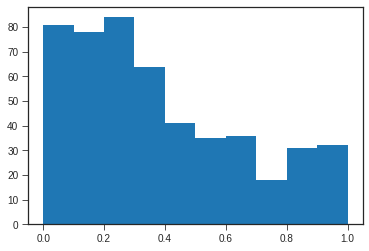

In [231]:
plt.hist(psm_performance[0, :, 1], range=(0, 1))

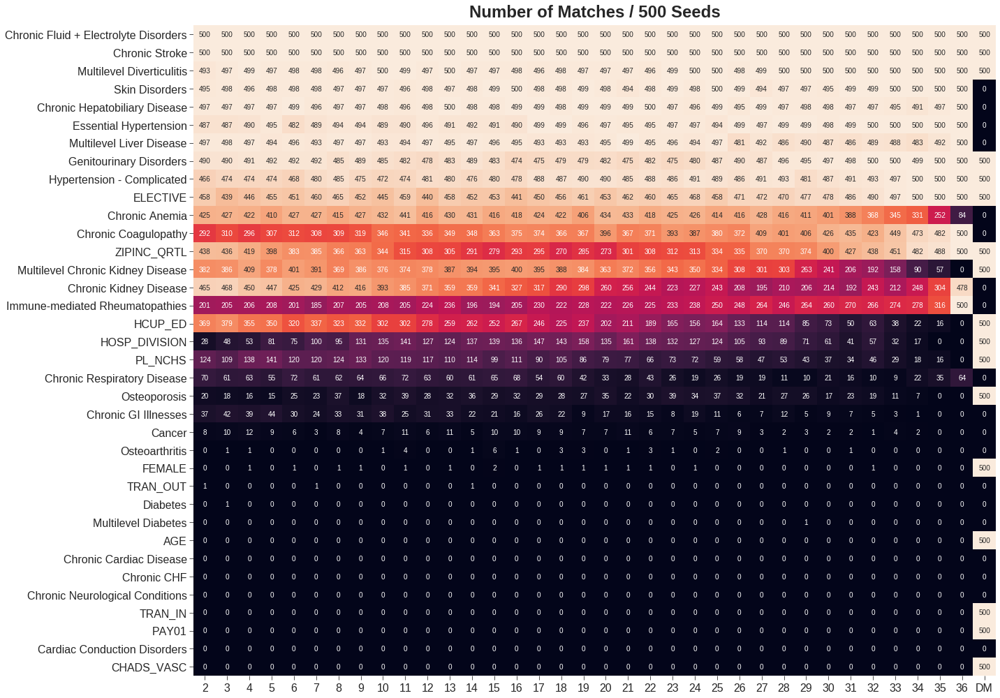

In [216]:
plt.style.use('seaborn-ticks')

fig, ax = plt.subplots(1, figsize=(20, 14))

matches = np.sum(psm_performance > 0.05, axis=1) # Sum matches (p > 0.05) across all seeds
asort = np.argsort(-np.sum(matches, axis=0)) # Sort features by those that were matched most commonly
matches = matches[:, asort]
matches = np.vstack((matches, (all_pvals['deep'][asort] > 0.05) * 500))
feature_names = all_pvals.index[asort]

psm_perf_match = pd.DataFrame(matches.T, index=feature_names, columns=list(range(2, 37)) + ['DM', ])
b1 = sns.heatmap(psm_perf_match, ax=ax, annot=True, cbar=False, fmt='d')

b1.axes.set_title('Number of Matches / 500 Seeds (RANDOM)', fontsize=24, fontweight='bold', pad=12)

b1.tick_params(labelsize=16)

fig.tight_layout()

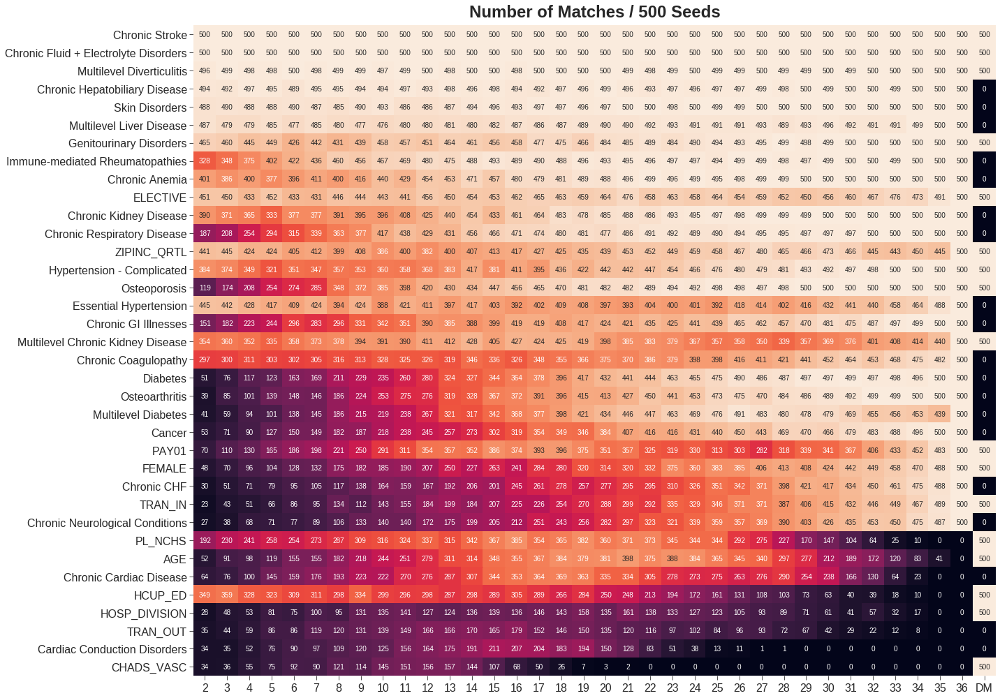

In [366]:
plt.style.use('seaborn-ticks')

fig, ax = plt.subplots(1, figsize=(20, 14))

matches = np.sum(psm_perf_final > 0.05, axis=1) # Sum matches (p > 0.05) across all seeds
asort = np.argsort(-np.sum(matches, axis=0)) # Sort features by those that were matched most commonly
matches = matches[:, asort]
matches = np.vstack((matches, (all_pvals['deep'][asort] > 0.05) * 500))
feature_names = all_pvals.index[asort]

psm_perf_match = pd.DataFrame(matches.T, index=feature_names, columns=list(range(2, 37)) + ['DM', ])
b1 = sns.heatmap(psm_perf_match, ax=ax, annot=True, cbar=False, fmt='d')

b1.axes.set_title('Number of Matches / 500 Seeds', fontsize=24, fontweight='bold', pad=12)

b1.tick_params(labelsize=16)

fig.tight_layout()

In [128]:
matches = np.sum(psm_performance > 0.05, axis=1)

In [136]:
matches.shape

(35, 36)